In [1]:
import os
from langchain.llms import OpenAI
from diffusers import DiffusionPipeline
import torch
from langchain.prompts import PromptTemplate
from langchain.chains import LLMChain

C:\Users\Jeevabharathi\anaconda3\envs\cuda_test\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Jeevabharathi\anaconda3\envs\cuda_test\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(


In [3]:
os.environ['OPENAI_API_KEY'] = "##########################"
llm = OpenAI(temperature=1)
pipe = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16") 
pipe.to("cuda")

C:\Users\Jeevabharathi\anaconda3\envs\cuda_test\lib\site-packages\langchain_core\_api\deprecation.py:117: LangChainDeprecationWarning: The class `langchain_community.llms.openai.OpenAI` was deprecated in langchain-community 0.0.10 and will be removed in 0.2.0. An updated version of the class exists in the langchain-openai package and should be used instead. To use it run `pip install -U langchain-openai` and import as `from langchain_openai import OpenAI`.
  warn_deprecated(
C:\Users\Jeevabharathi\anaconda3\envs\cuda_test\lib\site-packages\diffusers\utils\outputs.py:63: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  torch.utils._pytree._register_pytree_node(
Loading pipeline components...: 100%|██████████| 7/7 [00:02<00:00,  2.75it/s]


StableDiffusionXLPipeline {
  "_class_name": "StableDiffusionXLPipeline",
  "_diffusers_version": "0.26.3",
  "_name_or_path": "stabilityai/stable-diffusion-xl-base-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": true,
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [13]:
prompt_template_1 = PromptTemplate(
    input_variables =['input'],
    template="Give me an enhanced prompt for my text-to-image model for the following user prompt: '{input}', make sure the image looks cinematic, narrow depth of field and realistic and the prompt have only 25 words")
input_prompt = input("Enter the basic prompt for the image :")
#prompt_template_1.format( input = input_prompt)
chain1 = LLMChain(llm=llm, prompt = prompt_template_1)
prompt = chain1.run(input_prompt)
print(prompt)

Enter the basic prompt for the image :  picture of a grizzly bear wearing a blazer walking in a foggy rainforest shot using a super wide angle lens.




Cinematic shot: A majestic grizzly bear, donning a sleek blazer, strutting through a foggy rainforest, captured with a hyper-wide angle lens for a dramatic, shallow depth of field effect.


  0%|          | 0/100 [00:00<?, ?it/s]C:\Users\Jeevabharathi\anaconda3\envs\cuda_test\lib\site-packages\diffusers\models\attention_processor.py:1244: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  hidden_states = F.scaled_dot_product_attention(
100%|██████████| 100/100 [01:21<00:00,  1.23it/s]


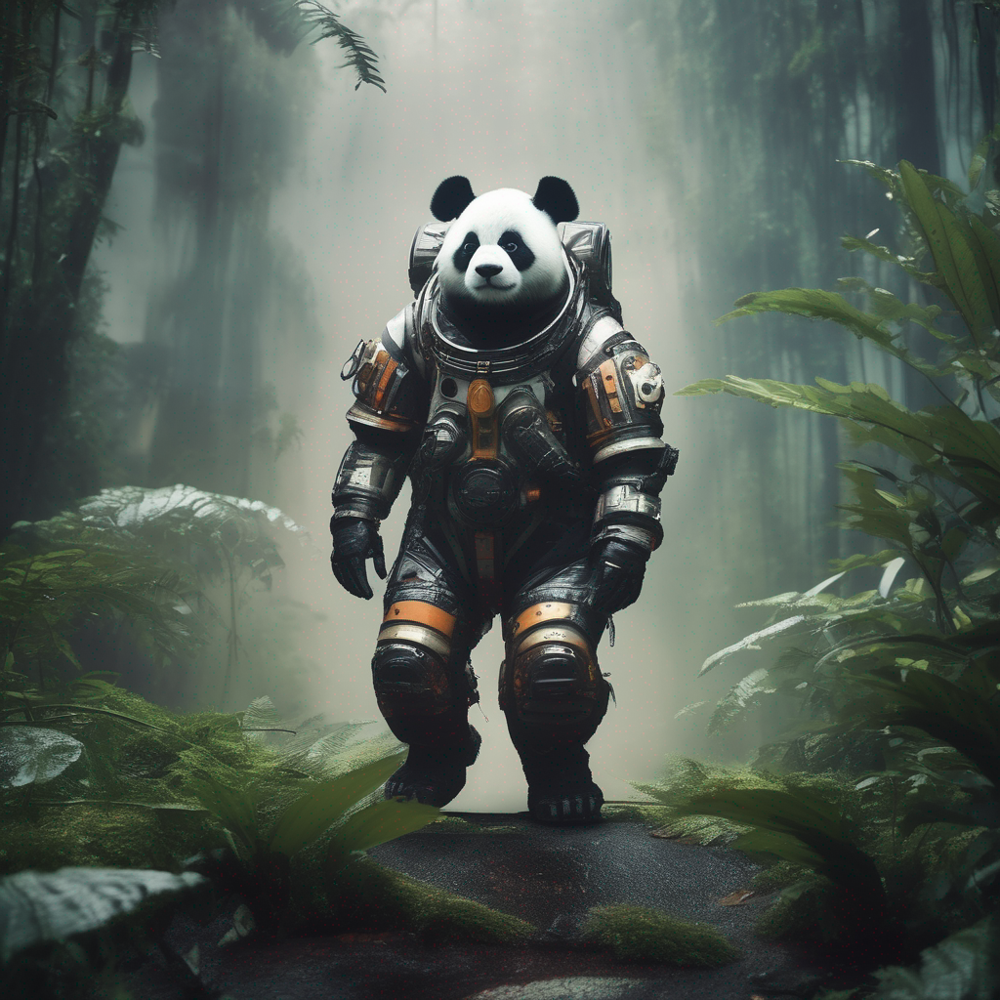

In [4]:

images = pipe(prompt=prompt, num_inference_steps=100).images[0]
images

100%|██████████| 100/100 [01:22<00:00,  1.22it/s]


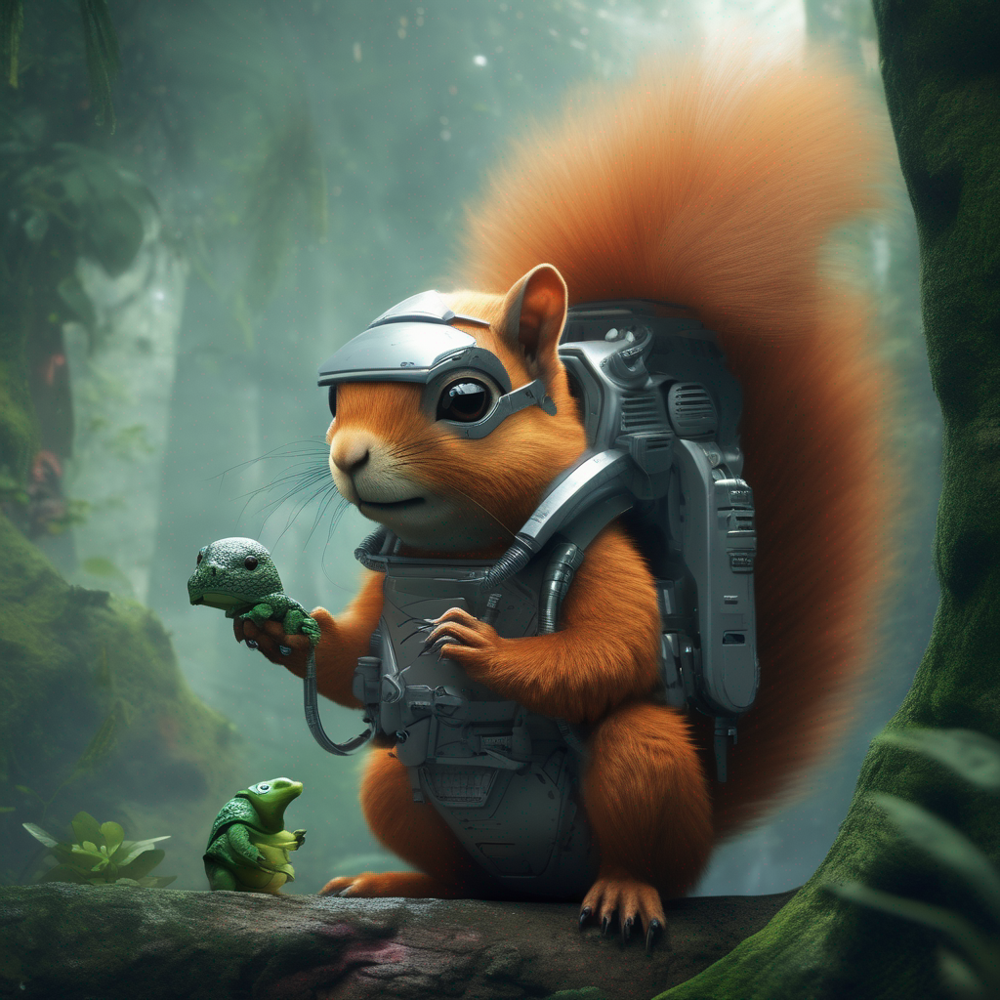

In [7]:
images = pipe(prompt=prompt, num_inference_steps=100).images[0]
images

100%|██████████| 50/50 [00:41<00:00,  1.20it/s]


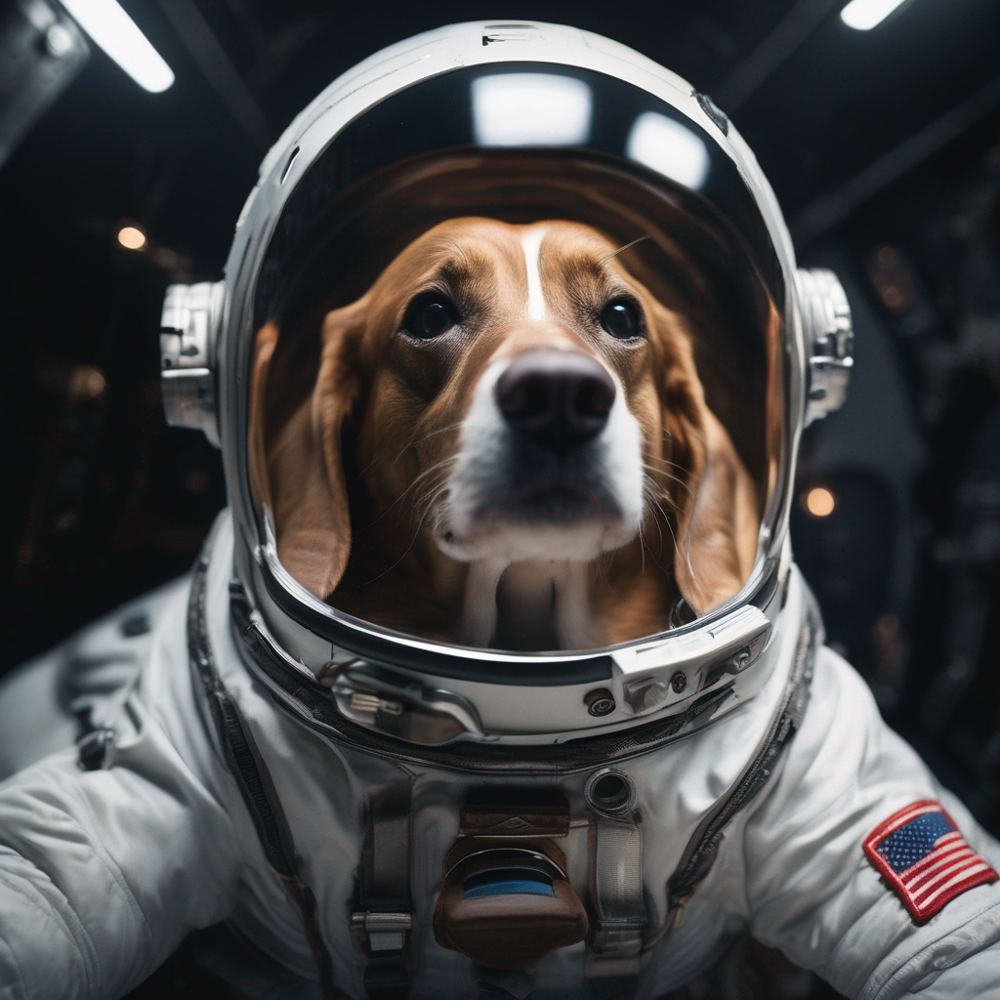

In [14]:
images = pipe(prompt=prompt, num_inference_steps=50).images[0]
images

100%|██████████| 300/300 [04:51<00:00,  1.03it/s]


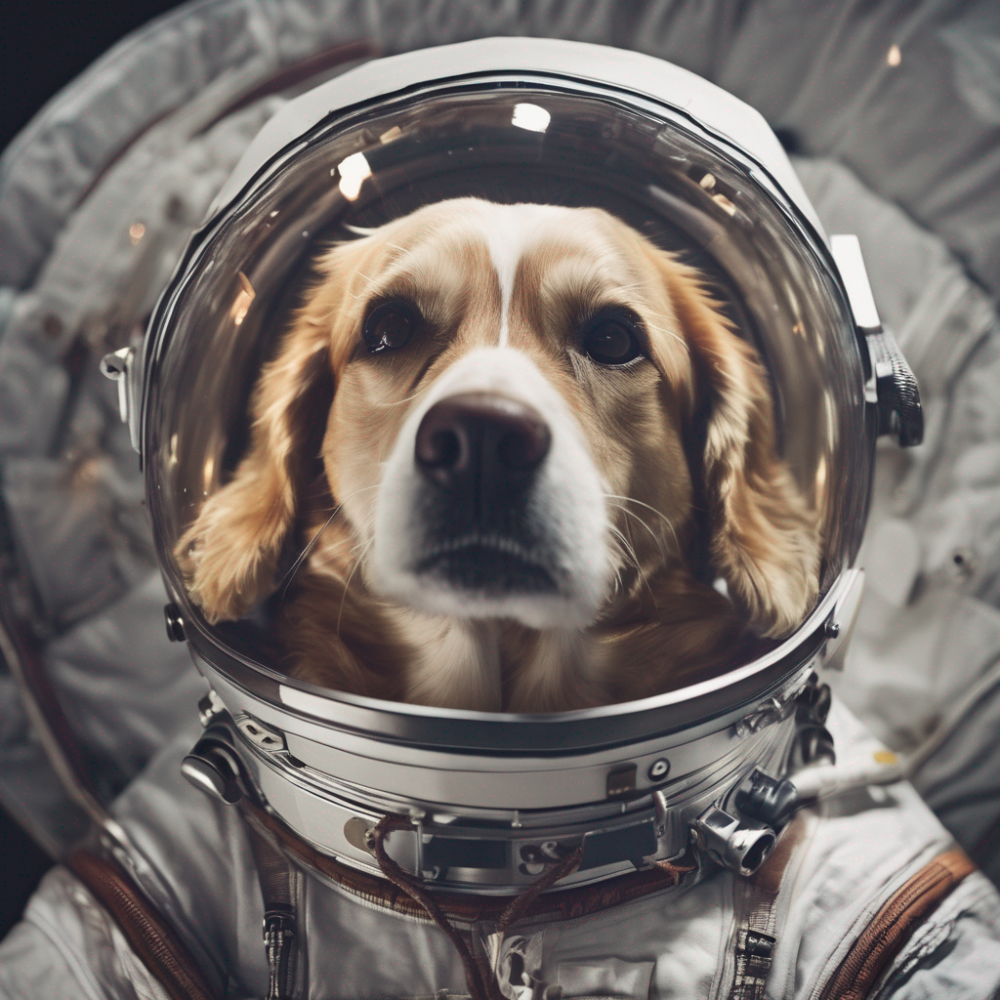

In [19]:
images = pipe(prompt=prompt, num_inference_steps=300).images[0]
images

  0%|          | 0/500 [00:00<?, ?it/s]C:\Users\Jeevabharathi\anaconda3\envs\cuda_test\lib\site-packages\diffusers\models\attention_processor.py:1244: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:263.)
  hidden_states = F.scaled_dot_product_attention(
100%|██████████| 500/500 [08:13<00:00,  1.01it/s]


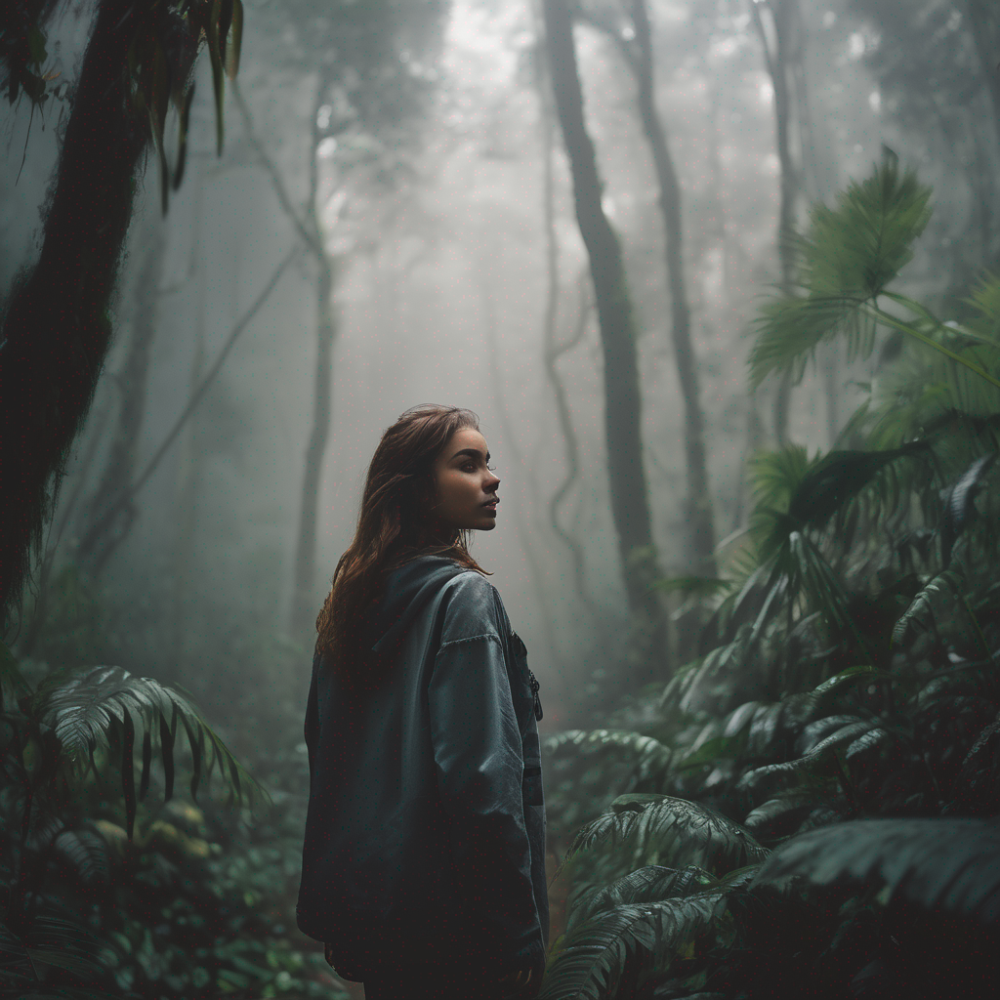

In [6]:
images = pipe(prompt=prompt, num_inference_steps=500).images[0]
images

100%|██████████| 500/500 [05:46<00:00,  1.44it/s]


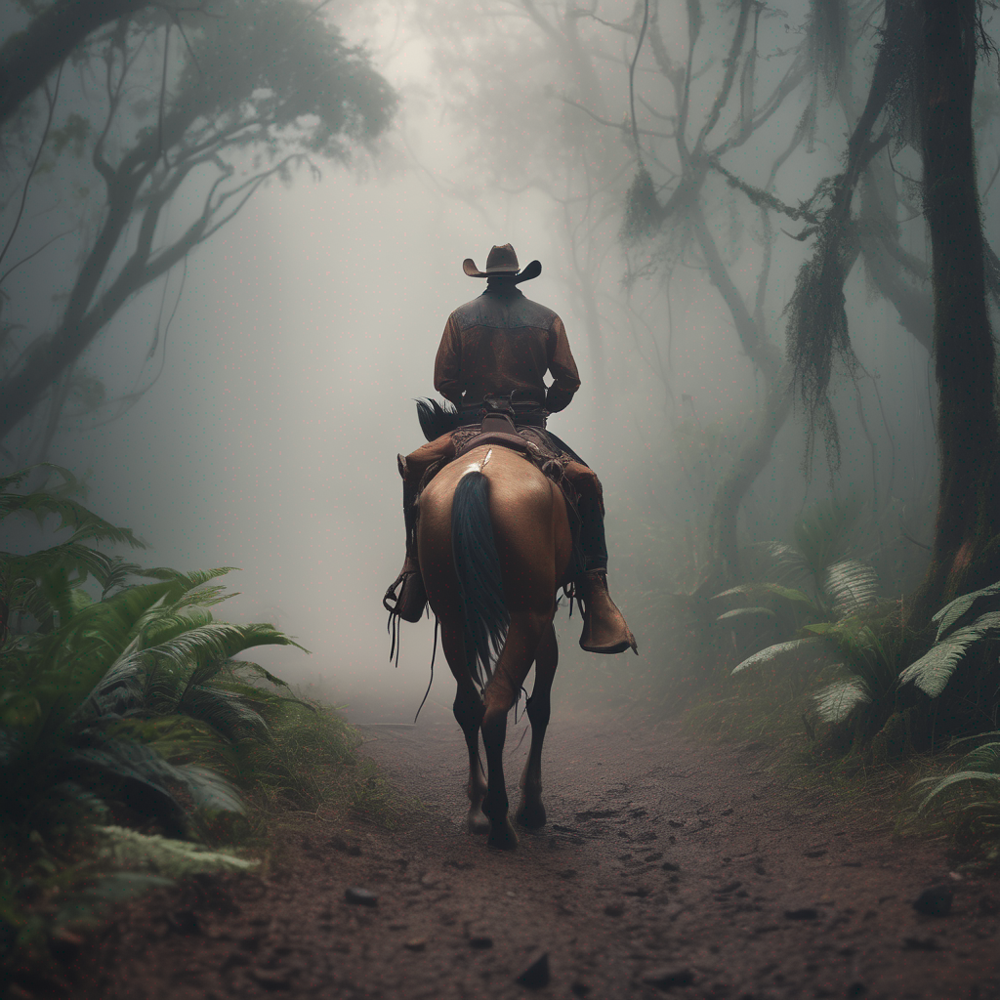

In [8]:
images = pipe(prompt=prompt, num_inference_steps=500).images[0]
images

100%|██████████| 500/500 [05:16<00:00,  1.58it/s]


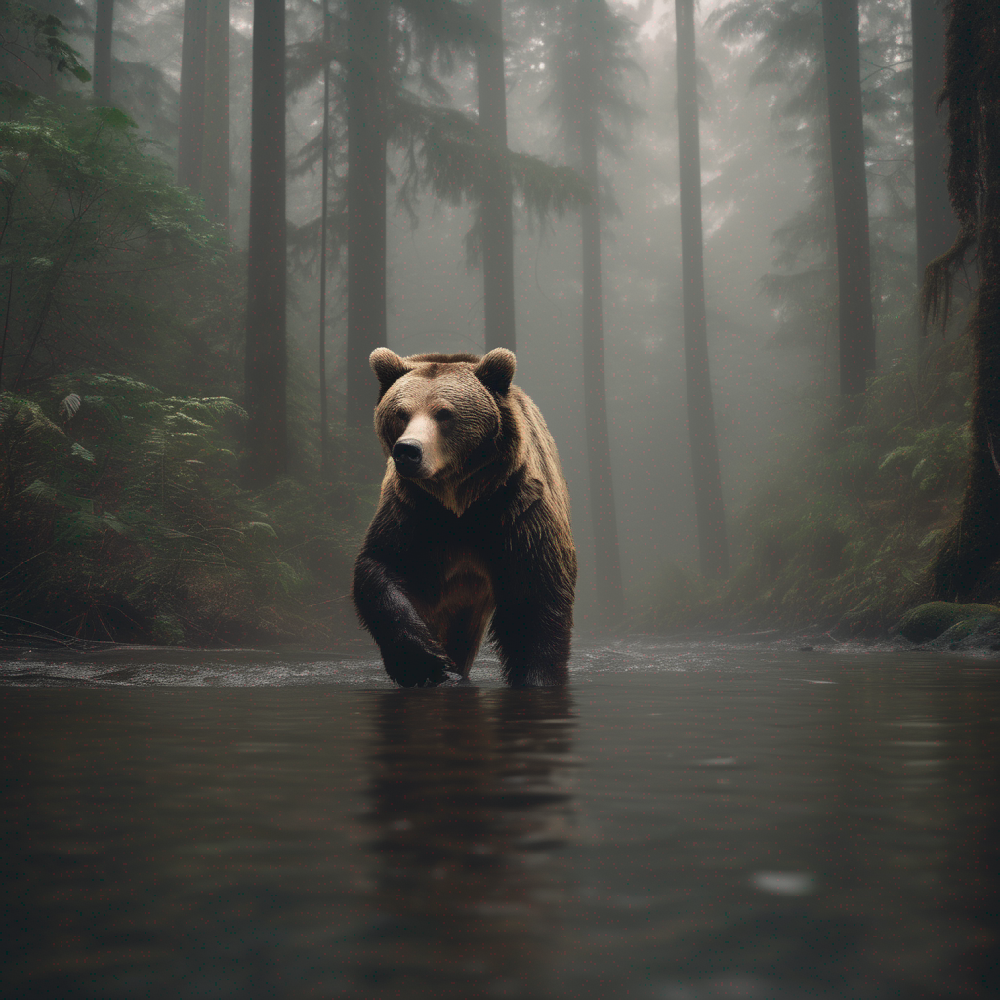

In [14]:
images = pipe(prompt=prompt, num_inference_steps=500).images[0]
images